# Project 2 - Columbus Traffic Stop Outcomes

In [1]:
# Import libraries
import pandas as pd
import os

In [2]:
df_original = pd.read_csv('oh_columbus_2019_08_13.csv')

In [3]:
df_original.head()

,raw_row_number,date,time,location,lat,lng,precinct,zone,subject_race,subject_sex,type,arrest_made,citation_issued,warning_issued,outcome,search_conducted,reason_for_stop,raw_enforcement_taken
0,1|2|3,2012-01-01,01:16:00,livingston and carpenter,39.949920,-82.975067,11.0,5.0,white,female,vehicular,True,False,False,arrest,True,Moving Violation,Arrest|Vehicle Search|Driver Search
1,4,2012-01-01,01:20:00,E 16th Ave and Waldeck Ave,40.001043,-83.006871,4.0,4.0,white,male,vehicular,False,False,True,warning,False,Moving Violation,Verbal Warning
2,5,2012-01-01,07:54:00,king ave and cannon dr,39.990708,-83.020528,NaN,NaN,black,male,vehicular,False,False,True,warning,False,Moving Violation,Verbal Warning
3,6,2012-01-01,10:00:00,James rd and Livingston ave,39.946876,-82.915567,9.0,2.0,black,male,vehicular,False,False,True,warning,False,Moving Violation,Verbal Warning
4,7,2012-01-01,10:50:00,N Wilson Road and Twin Creeks,39.979569,-83.102749,15.0,3.0,black,female,vehicular,False,False,True,warning,False,Moving Violation,Verbal Warning


In [4]:
#Making a duplicate of the dataframe to retain the original
df = df_original.copy()

In [5]:
df.head()

,raw_row_number,date,time,location,lat,lng,precinct,zone,subject_race,subject_sex,type,arrest_made,citation_issued,warning_issued,outcome,search_conducted,reason_for_stop,raw_enforcement_taken
0,1|2|3,2012-01-01,01:16:00,livingston and carpenter,39.949920,-82.975067,11.0,5.0,white,female,vehicular,True,False,False,arrest,True,Moving Violation,Arrest|Vehicle Search|Driver Search
1,4,2012-01-01,01:20:00,E 16th Ave and Waldeck Ave,40.001043,-83.006871,4.0,4.0,white,male,vehicular,False,False,True,warning,False,Moving Violation,Verbal Warning
2,5,2012-01-01,07:54:00,king ave and cannon dr,39.990708,-83.020528,NaN,NaN,black,male,vehicular,False,False,True,warning,False,Moving Violation,Verbal Warning
3,6,2012-01-01,10:00:00,James rd and Livingston ave,39.946876,-82.915567,9.0,2.0,black,male,vehicular,False,False,True,warning,False,Moving Violation,Verbal Warning
4,7,2012-01-01,10:50:00,N Wilson Road and Twin Creeks,39.979569,-83.102749,15.0,3.0,black,female,vehicular,False,False,True,warning,False,Moving Violation,Verbal Warning


## Selecting a target

I'll be trying to predict whether an action is taken against the subject being pulled over (this includes 'arrest' or 'citation') of the subject is let off with a warning. This will be a **binary classification** problem, using **ROC AUC** as my evaluation metric

## Selecting how to train/test split

The dates range from the start of 2012 to the end of 2016. For this dataset, I'll **train** on 2012 through 2014, **validate** on 2015 and **test** on 2016

In [6]:
# Converting date and time to datetime format to split the data
df['date'] = pd.to_datetime(df['date'])

In [7]:
#Separating my data
my_train = df[df['date'] <= '2014-12-31']
my_val = df[(df['date'] >= '2015-01-01') & (df['date'] <= '2015-12-31')]
test = df[df['date'] >= '2016-01-01']

In [8]:
my_train.shape,my_val.shape,test.shape

((79281, 18), (24126, 18), (24750, 18))

In [9]:
#Checking to make sure I grabbed all of the data
my_train.shape[0] + my_val.shape[0] + test.shape[0] == df.shape[0]

True

In [10]:
#Citation and arrest will be merged into a single value and be the 
my_train['outcome'].value_counts(normalize=True)

citation    0.555233
warning     0.405169
arrest      0.039598
Name: outcome, dtype: float64

## Data Exploration / Cleaning

In [11]:
my_train.describe()

,lat,lng,precinct,zone
count,72577.000000,72577.000000,69423.000000,69423.000000
mean,39.991674,-82.985187,10.144131,3.223010
std,0.061422,0.076864,5.670301,1.472846
min,39.414070,-84.164396,1.000000,1.000000
25%,39.952456,-83.017007,5.000000,2.000000
50%,39.977232,-82.991951,10.000000,4.000000
75%,40.023498,-82.958907,16.000000,5.000000
max,40.602883,-80.715531,20.000000,5.000000


In [12]:
my_train.describe(exclude='number')

,raw_row_number,date,time,location,subject_race,subject_sex,type,arrest_made,citation_issued,warning_issued,outcome,search_conducted,reason_for_stop,raw_enforcement_taken
count,79281,79281,79163,79281,79281,79281,79281,79281,79281,79281,79246,79281,79281,79281
unique,79281,1096,1437,35986,5,2,1,2,2,2,3,2,4,120
top,60155|60156|60157|60158,2012-02-03 00:00:00,16:00:00,70 and CHAMPION,white,male,vehicular,False,True,False,citation,False,Moving Violation,Traffic Citation
freq,1,162,247,645,40114,51984,79281,76143,46299,46480,44000,74350,59412,39778
first,NaN,2012-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,NaN,2014-12-31 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
my_train.isnull().sum()

raw_row_number              0
date                        0
time                      118
location                    0
lat                      6704
lng                      6704
precinct                 9858
zone                     9858
subject_race                0
subject_sex                 0
type                        0
arrest_made                 0
citation_issued             0
warning_issued              0
outcome                    35
search_conducted            0
reason_for_stop             0
raw_enforcement_taken       0
dtype: int64

In [14]:
df['location'].value_counts()

hamilton and 70                 758
i670wb and i71                  663
70 and CHAMPION                 647
70 and OHIO                     605
broad and mcnaughten            569
                               ... 
S/B 270 and ROBERTS RD            1
E. 161 and Satinwood Dr.          1
W Town st and Hawkes Ave          1
college ave and brookwood rd      1
Gerbert and E 26th                1
Name: location, Length: 54338, dtype: int64

In [15]:
my_train['precinct'].value_counts(dropna=False
)

NaN     9858
16.0    7196
4.0     6655
3.0     5227
7.0     4270
12.0    4184
18.0    3924
9.0     3924
6.0     3693
17.0    3299
8.0     3228
14.0    3145
10.0    3110
11.0    2582
5.0     2511
1.0     2484
19.0    2431
2.0     2276
20.0    2240
13.0    1542
15.0    1502
Name: precinct, dtype: int64

- 'raw_row_number' just seems to count each individual action against a person. Three actions were taken against the first person, so that is raw_row_number 1,2, and 3.  That probably isn't useful, so I'll remove it


- 'location' is interesting in that is an intersection. I need to explore it more to see if it 'x and y' and also 'y and x' exist. I could strip out the ' and ' and separate the two crossroads into different columns.


- 'type' is a single value, so I can drop it


- 'arrest_made',  'citation_issued', and 'warning_issued' can be dropped because 'warning_issued' will be used as my binary classifier. I will need to invert the t/f and astype it to an integer.


- I need to do more exploration on 'search_conducted'. I'll likely drop that as data leakage since I feel like it would be highly correlated with action taken... After further exploration, the data is too dirty to deal with. There are multiple spellings, spelling errors, formatting differences. Also, this is covered in long/lat coordinates.


- 'raw_enforcement_taken' will be dropped as it includes my target

## Data Wrangling

In [16]:
def wrangle(X):
    
    #To prevent a warning.
    X = X.copy()
    
    # Pulling hour and minute from time column
    X['hour'] = pd.to_datetime(X['time']).dt.hour
    X['minute'] = pd.to_datetime(X['time']).dt.minute
    #X = X.drop(columns='time')
    
    #Pulling month and day and day of week from date
    X['month'] = X['date'].dt.month
    X['day'] = X['date'].dt.day
    X['day_of_week'] = X['date'].dt.weekday_name
    
    
    #Dropping unecessary columns
    #NOTE: location is too dirty now, but I'll attempt to clean it later
    X = X.drop(columns=['raw_row_number','type','location'])
    
    #Dropping data leakage/time-traveling data
    X = X.drop(columns=['arrest_made','citation_issued','warning_issued',
                        'search_conducted','raw_enforcement_taken'] )
    
    
    #Creating separate columns if a row has these values missing.
    col_has_missing = ['time','lat','lng','precinct','zone']
    for column in col_has_missing:
        X[column+'_MISSING'] = X[column].isnull()
        
    # converting outcome column to 1/0
    # 1 if a citation or arrest occured
    
    X['outcome'] = (X['outcome'] != 'warning').astype(int)
    
    return X
    
    

In [17]:
my_train = wrangle(my_train)
my_val = wrangle(my_val)
test = wrangle(test)

In [18]:
my_train.head()

,date,time,lat,lng,precinct,zone,subject_race,subject_sex,outcome,reason_for_stop,hour,minute,month,day,day_of_week,time_MISSING,lat_MISSING,lng_MISSING,precinct_MISSING,zone_MISSING
0,2012-01-01,01:16:00,39.949920,-82.975067,11.0,5.0,white,female,1,Moving Violation,1.0,16.0,1,1,Sunday,False,False,False,False,False
1,2012-01-01,01:20:00,40.001043,-83.006871,4.0,4.0,white,male,0,Moving Violation,1.0,20.0,1,1,Sunday,False,False,False,False,False
2,2012-01-01,07:54:00,39.990708,-83.020528,NaN,NaN,black,male,0,Moving Violation,7.0,54.0,1,1,Sunday,False,False,False,True,True
3,2012-01-01,10:00:00,39.946876,-82.915567,9.0,2.0,black,male,0,Moving Violation,10.0,0.0,1,1,Sunday,False,False,False,False,False
4,2012-01-01,10:50:00,39.979569,-83.102749,15.0,3.0,black,female,0,Moving Violation,10.0,50.0,1,1,Sunday,False,False,False,False,False


## Some Exploratory Visualizations

In [19]:
import matplotlib as mpl
#Setting dip to get graphs with a higher resolution
mpl.rcParams['figure.dpi'] = 300
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

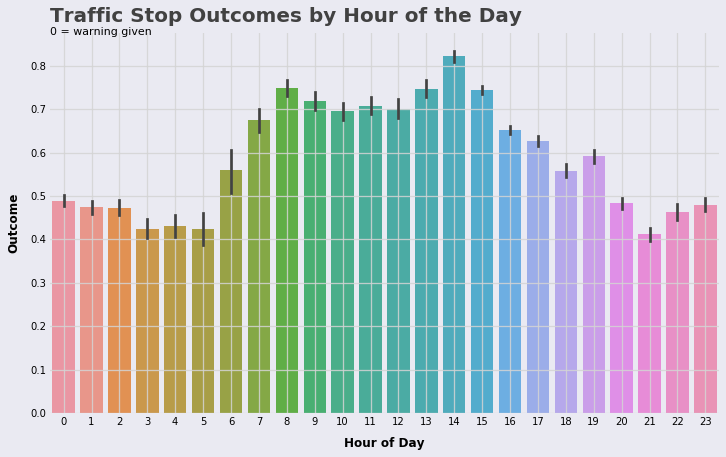

In [20]:
fig = plt.figure(figsize=(12,7))

ax = sns.barplot(my_train['hour'].dropna(), my_train['outcome'])

fig.set(facecolor='#EAEAF2')

#Title
plt.text(x=-.5, y=0.90, s='Traffic Stop Outcomes by Hour of the Day',
        color='#414141',
        fontsize=20,
        fontweight='bold',
        family='sans-serif')
#Subtitle
plt.text(x=-.5, y=0.87, s="0 = warning given",
        fontsize=11)


#Setting x and y labels 
plt.ylabel('Outcome',
              fontsize=12,
           fontweight='bold',
              labelpad=10)
plt.xlabel('Hour of Day',
              fontsize=12,
              fontweight='bold',
              labelpad=10)

#Setting ticks to show more resolution
plt.xticks(np.arange(0, 24, step=1),
          labels=[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23])

#Removing the small, black tick marks
plt.tick_params(axis='both', size=0)

#Place-holding in case I want to adjust the outer frame
#Note: This + fig.set(facecolor) is what changes the whole graph to grey
plt.box(on=None)

#Showing grid, adjusting color, length, and opacity
plt.grid(color='#D4D4D4', lw=1.3,alpha=0.85)


#Setting the axes to show above the grid, otherwise the grid lines were on top
plt.rcParams['axes.axisbelow'] = False



plt.show()
# plt.savefig('by_day_of_week.png', dpi=300)



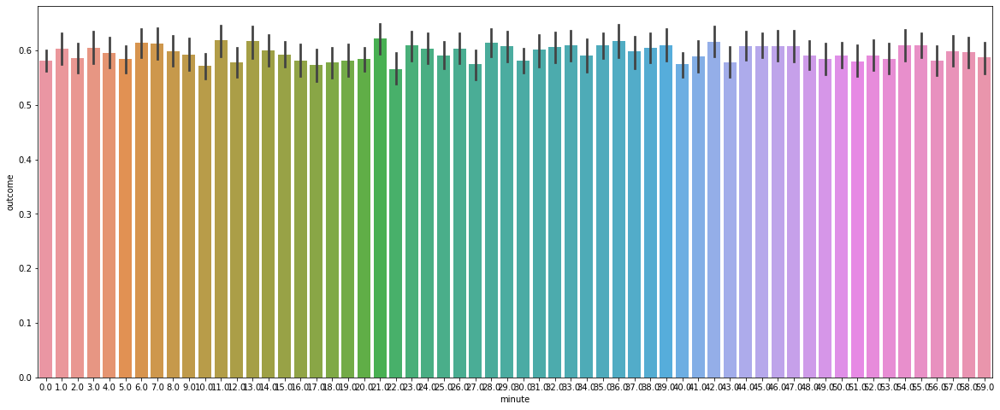

In [21]:
plt.figure(figsize=(20,8))
ax = sns.barplot(my_train['minute'].dropna(), my_train['outcome'])

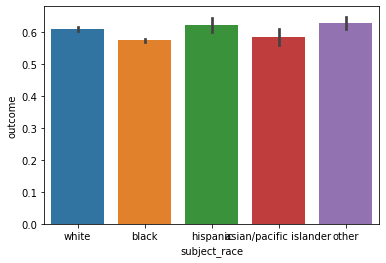

In [22]:
sns.barplot(my_train['subject_race'], my_train['outcome'])

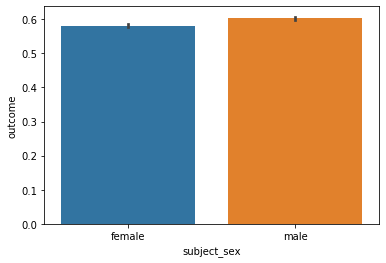

In [23]:
sns.barplot(my_train['subject_sex'], my_train['outcome'])

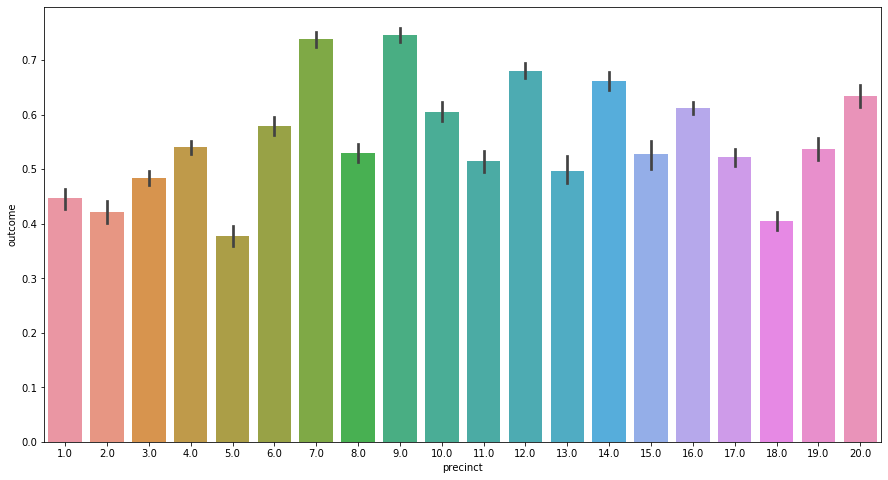

In [24]:
plt.figure(figsize=(15,8))

ax = sns.barplot(my_train['precinct'].dropna(), my_train['outcome'])

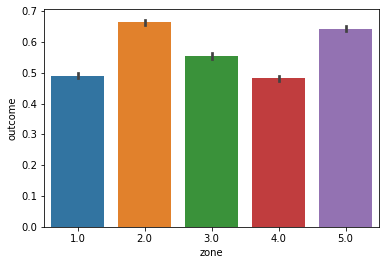

In [25]:
sns.barplot(my_train['zone'].dropna(), my_train['outcome'])

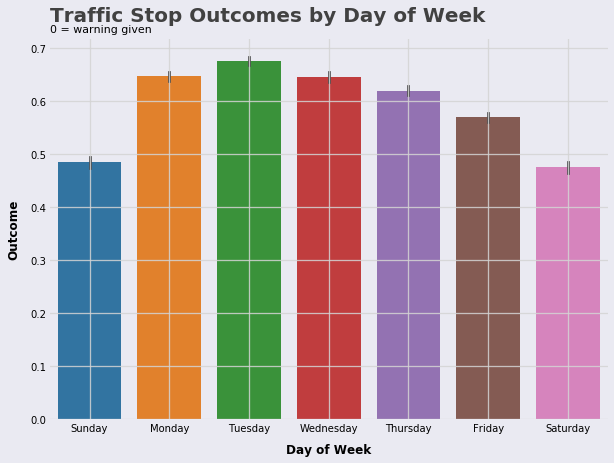

In [26]:
fig = plt.figure(figsize=(10,7))

ax = sns.barplot(my_train['day_of_week'].dropna(), my_train['outcome'])

fig.set(facecolor='#EAEAF2')

#Title
plt.text(x=-.5, y=0.75, s='Traffic Stop Outcomes by Day of Week',
        color='#414141',
        fontsize=20,
        fontweight='bold',
        family='sans-serif')
#Subtitle
plt.text(x=-.5, y=0.73, s="0 = warning given",
        fontsize=11)


#Setting x and y labels 
plt.ylabel('Outcome',
              fontsize=12,
           fontweight='bold',
              labelpad=10)
plt.xlabel('Day of Week',
              fontsize=12,
              fontweight='bold',
              labelpad=10)

#Place-holding in case I want to adjust the outer frame
#Note: This + fig.set(facecolor) is what changes the whole graph to grey
plt.box(on=None)

#Showing grid, adjusting color, length, and opacity
plt.grid(color='#D4D4D4', lw=1.3,alpha=0.85)


#Setting the axes to show above the grid, otherwise the grid lines were on top
plt.rcParams['axes.axisbelow'] = False

#Removing the small, black tick marks
plt.tick_params(axis='both', size=0)


plt.show()
# plt.savefig('by_day_of_week.png', dpi=300)



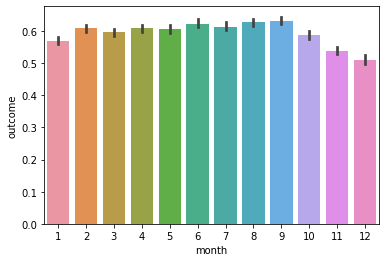

In [27]:
sns.barplot(my_train['month'].dropna(), my_train['outcome'])

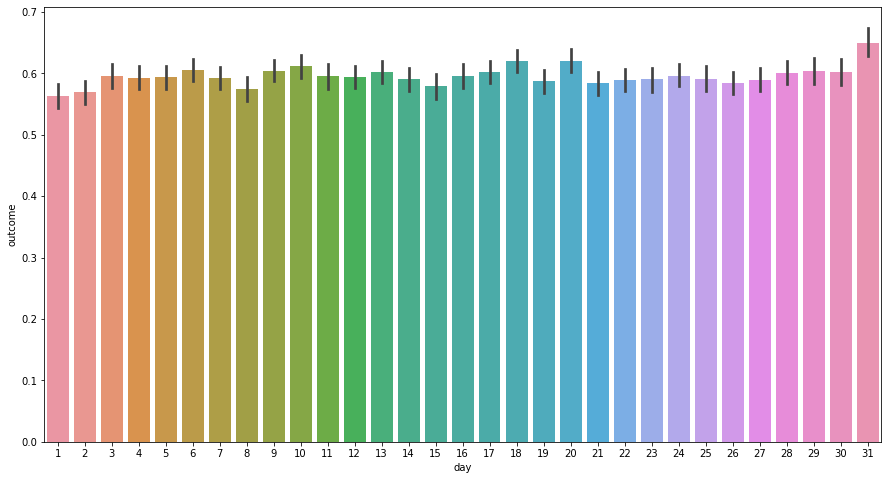

In [28]:
plt.figure(figsize=(15,8))

ax = sns.barplot(my_train['day'].dropna(), my_train['outcome'])

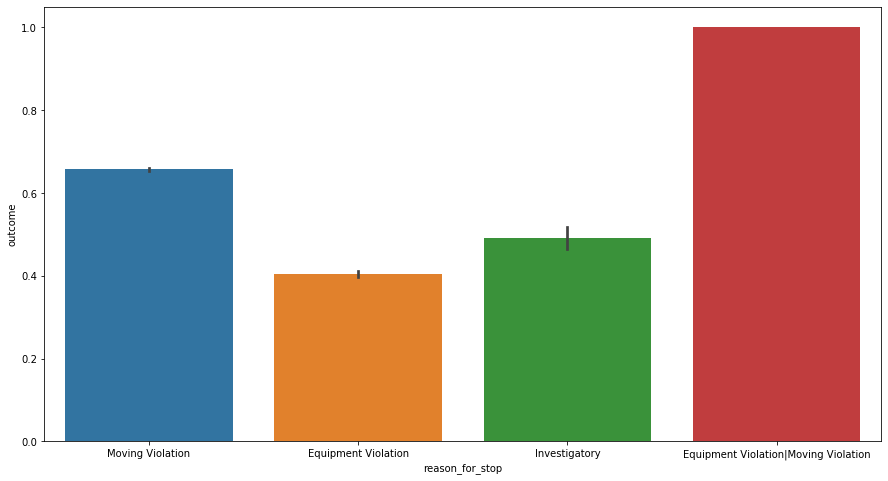

In [29]:
plt.figure(figsize=(15,8))

ax = sns.barplot(my_train['reason_for_stop'].dropna(), my_train['outcome'])

## Getting a baseline

In [30]:
target = 'outcome'
features = my_train.drop(columns=['outcome','date']).columns


X_train = my_train[features]
y_train = my_train[target]

X_val = my_val[features]
y_val = my_val[target]

X_test = test[features]
y_test = test[target]

### The baseline AUC score to beat is always 50%

## Fitting best model

In [35]:
import category_encoders as ce
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score

In [36]:
encoder = ce.OrdinalEncoder()
X_train_encoded = encoder.fit_transform(X_train)
X_val_encoded = encoder.transform(X_val)
X_test_encoded = encoder.transform(X_test)

In [37]:
eval_set = [(X_train_encoded, y_train),
            (X_val_encoded, y_val)]

In [38]:
model = XGBClassifier(
    n_estimators = 1000, # up to
    max_depth=6, #6 seems to be a good depth
    learning_rate=0.1,
    n_jobs=-1,
    random_state=333
)

In [39]:
model.fit(X_train_encoded,
          y_train, eval_set=eval_set,
          # Making sure to set metric to AUC
          eval_metric='auc',
          early_stopping_rounds=50)

[0]	validation_0-auc:0.721999	validation_1-auc:0.650822
Multiple eval metrics have been passed: 'validation_1-auc' will be used for early stopping.

Will train until validation_1-auc hasn't improved in 50 rounds.
[1]	validation_0-auc:0.72701	validation_1-auc:0.661967
[2]	validation_0-auc:0.727194	validation_1-auc:0.6628
[3]	validation_0-auc:0.728632	validation_1-auc:0.661302
[4]	validation_0-auc:0.731123	validation_1-auc:0.663711
[5]	validation_0-auc:0.732651	validation_1-auc:0.66669
[6]	validation_0-auc:0.735405	validation_1-auc:0.673139
[7]	validation_0-auc:0.73662	validation_1-auc:0.674508
[8]	validation_0-auc:0.737374	validation_1-auc:0.676282
[9]	validation_0-auc:0.738928	validation_1-auc:0.67791
[10]	validation_0-auc:0.739681	validation_1-auc:0.67776
[11]	validation_0-auc:0.740997	validation_1-auc:0.680375
[12]	validation_0-auc:0.742222	validation_1-auc:0.683264
[13]	validation_0-auc:0.743576	validation_1-auc:0.685278
[14]	validation_0-auc:0.744465	validation_1-auc:0.684367
[15]	

[141]	validation_0-auc:0.80363	validation_1-auc:0.705159
[142]	validation_0-auc:0.803989	validation_1-auc:0.705241
[143]	validation_0-auc:0.804269	validation_1-auc:0.705156
[144]	validation_0-auc:0.804446	validation_1-auc:0.705239
[145]	validation_0-auc:0.804817	validation_1-auc:0.705191
[146]	validation_0-auc:0.804866	validation_1-auc:0.705147
[147]	validation_0-auc:0.805262	validation_1-auc:0.705184
[148]	validation_0-auc:0.805599	validation_1-auc:0.70519
[149]	validation_0-auc:0.805649	validation_1-auc:0.705208
[150]	validation_0-auc:0.805866	validation_1-auc:0.705148
[151]	validation_0-auc:0.806046	validation_1-auc:0.705239
[152]	validation_0-auc:0.806431	validation_1-auc:0.705451
[153]	validation_0-auc:0.806899	validation_1-auc:0.705523
[154]	validation_0-auc:0.807118	validation_1-auc:0.705477
[155]	validation_0-auc:0.807426	validation_1-auc:0.705619
[156]	validation_0-auc:0.807899	validation_1-auc:0.70567
[157]	validation_0-auc:0.808258	validation_1-auc:0.705639
[158]	validation_

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=None, n_estimators=1000, n_jobs=-1,
              nthread=None, objective='binary:logistic', random_state=333,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

### By far the best validation score at 70.57%

In [40]:
#This model was overfitting the validation data by about 3% 
y_pred_proba = model.predict_proba(X_test_encoded)[:, 1]
y_pred = model.predict(X_test_encoded)
roc_auc_score(y_test, y_pred_proba)

0.6765150902698402

### An AUC of 67.65% is a 17.65% improvement over the baseline 

## Permutation Importances

In [41]:
# I need to have the data outside of a pipeline to find Permutation Importances

# Encoding and Imputing the data
transformers = make_pipeline(
    ce.OrdinalEncoder(), 
    SimpleImputer()
)

#Transforming the data
X_train_transformed = transformers.fit_transform(X_train)
X_val_transformed = transformers.transform(X_val)
X_test_transformed = transformers.transform(X_test)

#Setting the model with the optimal hyperparameters from above
model = XGBClassifier(
    n_estimators = 156, 
    max_depth=6, 
    learning_rate=0.1,
    n_jobs=-1
)
#Fitting the data to the model
model.fit(X_train_transformed, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=None, n_estimators=156, n_jobs=-1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [42]:
import eli5
from eli5.sklearn import PermutationImportance

permuter = PermutationImportance(
    model, 
    scoring='roc_auc', 
    n_iter=10, 
    random_state=333
)

permuter.fit(X_val_transformed, y_val)

PermutationImportance(cv='prefit',
                      estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                              colsample_bylevel=1,
                                              colsample_bynode=1,
                                              colsample_bytree=1, gamma=0,
                                              learning_rate=0.1,
                                              max_delta_step=0, max_depth=6,
                                              min_child_weight=1, missing=None,
                                              n_estimators=156, n_jobs=-1,
                                              nthread=None,
                                              objective='binary:logistic',
                                              random_state=0, reg_alpha=0,
                                              reg_lambda=1, scale_pos_weight=1,
                                              seed=None, silent=None,
                    

In [43]:
#Interesting that risk was a relatively poor indicator of failure

eli5.show_weights(
    permuter, 
    top=None, # to show all features
    feature_names=X_val.columns.tolist()
)

Weight,Feature
0.0605 ± 0.0037,hour
0.0324 ± 0.0021,reason_for_stop
0.0319 ± 0.0021,lat
0.0225 ± 0.0031,lng
0.0118 ± 0.0016,day_of_week
0.0038 ± 0.0016,lat_MISSING
0.0031 ± 0.0011,precinct
0.0027 ± 0.0006,subject_sex
0.0016 ± 0.0009,month
0.0010 ± 0.0011,subject_race


### Creating new test dataframe to visualize predictions

In [44]:
test_additions = test.copy()

In [45]:
# New column for model's probability prediction for each test observation
test_additions['Probability Predictions'] = y_pred_proba

In [46]:
# New column for model's binary prediction for each test observation
test_additions['Model Predictions'] = y_pred

In [47]:
# Re-adding the target to the dataframe as the actual outcoeme
test_additions['Actual Outcome'] = test[target]

In [48]:
# New column for if the prediction was correct
test_additions['Prediction was Correct?'] = test_additions['Actual Outcome'] == test_additions['Model Predictions']
# Casting type to integer for visualizing with plotly.express
test_additions['Prediction was Correct?'] = test_additions['Prediction was Correct?'].astype(int)

In [49]:
import plotly.express as px
# Visualizing Probability of Outcomes for Test Data
fig = px.scatter_mapbox(test_additions, lat='lat',lon='lng', color='Probability Predictions',opacity=0.9, color_discrete_sequence='ocean')
fig.update_layout(mapbox_style='stamen-toner')
fig.show()

In [50]:
# Visualizing Actual Outcomes for Test Data

fig = px.scatter_mapbox(test_additions, lat='lat',lon='lng', color='Actual Outcome',opacity=0.9, color_discrete_sequence='ocean')
fig.update_layout(mapbox_style='stamen-toner')
fig.show()

In [51]:
# Visualizing where the predictions were incorrect

fig = px.scatter_mapbox(test_additions, lat='lat',lon='lng', color='Prediction was Correct?',opacity=0.9 )
fig.update_layout(mapbox_style='stamen-toner')
fig.show()

### Analyzing the worst false-positive and false-negative predictions

In [52]:
test_additions.reset_index(drop=True).sort_values(by='Probability Predictions').head(5)

,date,time,lat,lng,precinct,zone,subject_race,subject_sex,outcome,reason_for_stop,...,day_of_week,time_MISSING,lat_MISSING,lng_MISSING,precinct_MISSING,zone_MISSING,Probability Predictions,Model Predictions,Actual Outcome,Prediction was Correct?
24206,2016-12-19,21:27:00,40.142950,-82.989272,1.0,1.0,white,female,0,Equipment Violation,...,Monday,False,False,False,False,False,0.072071,0,0,1
24419,2016-12-25,20:05:00,40.088463,-83.091836,17.0,1.0,black,female,0,Equipment Violation,...,Sunday,False,False,False,False,False,0.072191,0,0,1
24053,2016-12-15,20:12:00,40.146926,-82.970146,1.0,1.0,white,female,0,Equipment Violation,...,Thursday,False,False,False,False,False,0.084323,0,0,1
22503,2016-11-17,21:17:00,40.063620,-83.056952,17.0,1.0,white,female,0,Equipment Violation,...,Thursday,False,False,False,False,False,0.086192,0,0,1
23240,2016-12-02,04:05:00,39.981673,-82.823686,14.0,2.0,black,female,1,Equipment Violation,...,Friday,False,False,False,False,False,0.086590,0,1,0


In [53]:
X_test.iloc[[23240]]

,time,lat,lng,precinct,zone,subject_race,subject_sex,reason_for_stop,hour,minute,month,day,day_of_week,time_MISSING,lat_MISSING,lng_MISSING,precinct_MISSING,zone_MISSING
126647,04:05:00,39.981673,-82.823686,14.0,2.0,black,female,Equipment Violation,4.0,5.0,12,2,Friday,False,False,False,False,False


In [54]:
row = X_test.iloc[[23240]]

In [55]:
import shap

explainer = shap.TreeExplainer(model)
row_transformed = transformers.transform(row)
shap_values = explainer.shap_values(row_transformed)

shap.initjs()
shap.force_plot(
    link='logit',
    base_value=explainer.expected_value, 
    shap_values=shap_values, 
    features=row
)

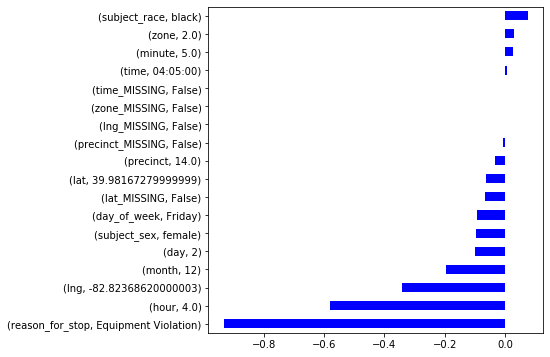

In [56]:
feature_names = row.columns
feature_values = row.values[0]
shaps = pd.Series(shap_values[0], zip(feature_names, feature_values))
shaps.sort_values().plot.barh(color='blue', figsize=(6,6));

In [57]:
test_additions.reset_index(drop=True).sort_values(by='Probability Predictions', ascending=False).head(5)

,date,time,lat,lng,precinct,zone,subject_race,subject_sex,outcome,reason_for_stop,...,day_of_week,time_MISSING,lat_MISSING,lng_MISSING,precinct_MISSING,zone_MISSING,Probability Predictions,Model Predictions,Actual Outcome,Prediction was Correct?
2167,2016-02-01,14:42:00,39.977232,-82.982175,7.0,5.0,other,male,1,Moving Violation,...,Monday,False,False,False,False,False,0.968493,1,1,1
12084,2016-06-14,15:31:00,39.977232,-82.982175,7.0,5.0,white,male,1,Moving Violation,...,Tuesday,False,False,False,False,False,0.963754,1,1,1
7878,2016-04-12,15:09:00,39.977232,-82.982175,7.0,5.0,other,male,1,Moving Violation,...,Tuesday,False,False,False,False,False,0.963246,1,1,1
7876,2016-04-12,14:37:00,39.977232,-82.982175,7.0,5.0,black,male,1,Moving Violation,...,Tuesday,False,False,False,False,False,0.962369,1,1,1
15261,2016-08-09,15:55:00,NaN,NaN,NaN,NaN,white,male,0,Moving Violation,...,Tuesday,False,True,True,True,True,0.961816,1,0,0


In [58]:
X_test.iloc[[15261]]

,time,lat,lng,precinct,zone,subject_race,subject_sex,reason_for_stop,hour,minute,month,day,day_of_week,time_MISSING,lat_MISSING,lng_MISSING,precinct_MISSING,zone_MISSING
118668,15:55:00,NaN,NaN,NaN,NaN,white,male,Moving Violation,15.0,55.0,8,9,Tuesday,False,True,True,True,True


In [59]:
row = X_test.iloc[[15261]]

In [60]:
import shap

explainer = shap.TreeExplainer(model)
row_transformed = transformers.transform(row)
shap_values = explainer.shap_values(row_transformed)

shap.initjs()
shap.force_plot(
    link='logit',
    base_value=explainer.expected_value, 
    shap_values=shap_values, 
    features=row
)

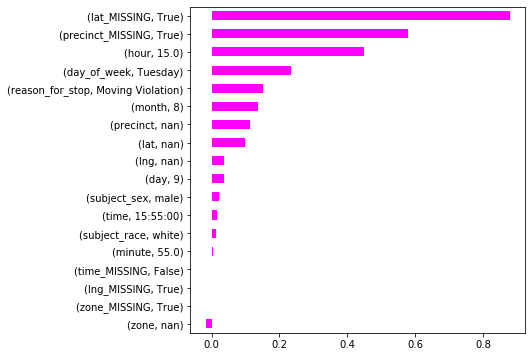

In [61]:
feature_names = row.columns
feature_values = row.values[0]
shaps = pd.Series(shap_values[0], zip(feature_names, feature_values))
shaps.sort_values().plot.barh(color='magenta', figsize=(6,6));